### University Trial

Github Link: 


In [1]:
import matplotlib
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.preprocessing import LabelEncoder, StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split 
import seaborn as sns
import glob
import os
import warnings
warnings.filterwarnings('ignore')
import scipy.signal as signal
from scipy.signal import find_peaks
import biosppy.signals.bvp as bvp
import entropy_estimators as ee
import biosppy.signals.resp as resp
import biosppy.signals.ecg as ecg
import biosppy.signals.tools as st
import peakutils
import plotly.graph_objs as go
import nolds
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from keras.models import Sequential
from keras.layers import LSTM, Dense, Embedding, SpatialDropout1D
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import pandas as pd

### Data Preprocessing

The function addTimeStamp(df,start,freq) is used to generate timestamp for each observation based on the starting time and the frequency.

* df = Data
* start = Start Time for the sequence
* freq = Frequency interval at which the observations are recorded

In [2]:
#Function to add time stamp to all the features reading based on starting time and frequency
def addTimeStamp(df,start,freq):  
    Timestamp=[]
    i=0
    while (i<len(df)):
        for j in range(freq): 
            if i>=len(df):
                break;
            Timestamp.append(start)
            i+=1
        start+=1
    return Timestamp

The function BVP_to_RR(hyperdata) is used to estimate the respiratory rate from the bvp signal peaks. 

- hyperdata = signal dataframe

In [3]:
#Function to estimate Respiratory Rate based on peaks of BVP Signal
def BVP_to_RR(hyperdata):
                fs=1.1
                # Remove baseline wander using a high-pass filter
                fc_hp = 0.5  # High-pass filter cutoff frequency in Hz
                b, a = signal.butter(2, fc_hp / (fs / 2), 'highpass')
                bvp_hp = signal.filtfilt(b, a, hyperdata)


                # Remove noise and extract frequency range using a bandpass filter
                fc_bp = [0.1, 0.5]  # Bandpass filter cutoff frequency in Hz
                b, a = signal.butter(2, fc_bp, 'bandpass')
                bvp_bp = signal.filtfilt(b, a, bvp_hp)
                #print(bvp_bp)

                dbvp_signal = np.diff(bvp_bp)

                # Find the peaks in the derivative signal
                peaks, _ = find_peaks(dbvp_signal, height=0)


                # Compute the inter-peak intervals (in seconds)
                ipi = np.diff(peaks) / fs
                #print(np.mean(ipi))
                # Compute the respiratory rate (in breaths per minute)
                rr = 60 / np.mean(ipi)
                return rr
               

## Loading the Data 

In [4]:
#path of raw data
input_path = 'D:\EssexFiles\DSDM\Stress-Predict-Dataset-main\Stress-Predict-Dataset-main\Raw_data' 
#path of feature specific files for individual paticipant combined with timestamp for each data 
temp_path= 'D:\EssexFiles\DSDM\Stress-Predict-Dataset-main\Stress-Predict-Dataset-main\Temp\\'  
#path of data of individual paticipant with features joined on Timestamp
output_path = 'D:\EssexFiles\DSDM\Stress-Predict-Dataset-main\Stress-Predict-Dataset-main\Data_Processed\\'
#temporary path for storing the respiratory rate generated along with the timestamp
tempRR='D:\EssexFiles\DSDM\Stress-Predict-Dataset-main\Stress-Predict-Dataset-main\TempRR\\' 

#creating a list of file paths present inside the input path
data_process = glob.glob(os.path.join(input_path, '**/*.csv'))  



for i in data_process:
    x = i.split('\\')
    
    #getting the participant number/sample number
    sampleName=x[len(x)-2]  
    x=x[len(x)-1].split(".")
    
    #getting the feature name
    fileName=x[0] 
    
    ## IBI data is disregarded as it is derived from the BVP data. Time tags are also not considered for timestamp entry
    if fileName=='IBI' or fileName=="tags_"+sampleName: 
        continue  
   
    colName=fileName+"_"+sampleName
    file_all=pd.read_csv(i,header=None, delimiter=",")
    colcount=len(file_all.index)
    #getting the initial start time of the session
    file_start= int(file_all.loc[0,0]) 
    #getting the frequency of the observations
    file_freq = int(file_all.loc[1,0])
    #getting the entire data frame without the first two rows  
    file_df=file_all.iloc[2:] 
    
    #Invoking the addTimeStamp function to get the timestamp value for each data  
    file_df["Timestamp"]=addTimeStamp(file_df,file_start,file_freq)  
    
    #ACC data column are named properly based on Axis    
    if fileName=='ACC':
        file_df.rename(columns={ file_df.columns[0]: "Accelerometer_X"}, inplace = True) 
        file_df.rename(columns={ file_df.columns[1]: "Accelerometer_Y"}, inplace = True) 
        file_df.rename(columns={ file_df.columns[2]: "Accelerometer_Z"}, inplace = True) 
    else:
    #Rest of the data columns are named properly based on Filename    
        file_df.rename(columns={ file_df.columns[0]: fileName }, inplace = True) 
    
    #Taking the mean of data which have same timestamp  
    file_df_mean=file_df.groupby(['Timestamp']).mean() 
    
    #####################################################
    for i in range(0, colcount%file_freq):
        file_df_mean.drop(index=file_df_mean.index[-1], inplace=True)
 
    #####################################################
    outputPath= temp_path+ sampleName +"\\" 
    if os.path.exists(outputPath) == False: 
        os.mkdir(outputPath) 
    outputPath= tempRR+ sampleName +"\\" 
    if os.path.exists(outputPath) == False: 
        os.mkdir(outputPath)
    colNameTemp="BVP_"+sampleName
    if colName==colNameTemp:
        file_df.to_csv(tempRR+ sampleName +"\\"+ colName +"_Time.csv" , encoding='utf-8', index=True)
    file_df_mean.to_csv(temp_path+ sampleName +"\\"+ colName +".csv" , encoding='utf-8', index=True)


In [5]:
temp_process = glob.glob(os.path.join(tempRR, '**/*.csv')) 
hyperdata=[]
rrstore=[]
respRate=0
fs=1.1
p=1
for i in temp_process: #Iterating participants
    x = i.split('\\')
     
    #getting the participant number/sample number
    sampleName=x[len(x)-2]  
    x=x[len(x)-1].split(".")
    s=1
    #getting the feature name
    fileName=x[0] 
    filenameTemp="BVP_"+sampleName+"_Time"
    ## IBI data is disregarded as it is derived from the BVP data. Time tags are also not considered for timestamp entry
    if fileName==filenameTemp: 
        file_all=pd.read_csv(i, delimiter=",")
        start= int(file_all.iloc[1,2])
        #print(start)
        for z in range(1,len(file_all)):
            #print(file_all.iloc[z-1,2])
            if file_all.iloc[z-1,2]==start:
                hyperdata.append(file_all.iloc[z-1,1])
                #print(hyperdata)
            else:
                respRate = BVP_to_RR(hyperdata)
                rrstore.append(respRate)
                start+=1
                hyperdata=[]
                #print("Done for S",s)
                s+=1
                
       ##########output path for Respiratory Rate#######
        outputPath= tempRR+ sampleName +"_RR\\" #path for rr storage
        if os.path.exists(outputPath) == False: 
            os.mkdir(outputPath)
        colNameTemp="BVP_"+sampleName
        
        sample= pd.read_csv(temp_path+ sampleName +"\\"+ colNameTemp +".csv", delimiter=",") 
        #########################
        rrdf=pd.DataFrame(rrstore)
        sample=pd.concat([sample, rrdf], axis=1) 
        sample.to_csv(temp_path+ sampleName +"\\"+ colNameTemp +".csv" , encoding='utf-8', index=False)
        rrstore=[] 
        print("Respiratory Rate estimated for sample ",p)
        p+=1

Respiratory Rate estimated for sample  1
Respiratory Rate estimated for sample  2
Respiratory Rate estimated for sample  3
Respiratory Rate estimated for sample  4
Respiratory Rate estimated for sample  5
Respiratory Rate estimated for sample  6
Respiratory Rate estimated for sample  7
Respiratory Rate estimated for sample  8
Respiratory Rate estimated for sample  9
Respiratory Rate estimated for sample  10
Respiratory Rate estimated for sample  11
Respiratory Rate estimated for sample  12
Respiratory Rate estimated for sample  13
Respiratory Rate estimated for sample  14
Respiratory Rate estimated for sample  15
Respiratory Rate estimated for sample  16
Respiratory Rate estimated for sample  17
Respiratory Rate estimated for sample  18
Respiratory Rate estimated for sample  19
Respiratory Rate estimated for sample  20
Respiratory Rate estimated for sample  21
Respiratory Rate estimated for sample  22
Respiratory Rate estimated for sample  23
Respiratory Rate estimated for sample  24
R

The  first row of each dataset is the initial time of the session expressed as unix timestamp in UTC. The second row is the sample rate expressed in Hz. Using this information, the Timestamp of each observation is calculated and a column with the timestamp is added to each dataset. The IBI dataset is not considered as it has been derived from the BVP. The ACC dataset columns are named properly. For the observations with same timestamp, the mean of all such observations are considered and mapped to that particular timestamp.   

In [6]:
for i in range (1,36):
    if i<10:
        sampleNumber="S0"+str(i)
    else:
        sampleNumber="S"+str(i)
    data_join = glob.glob(os.path.join(temp_path, sampleNumber+'/*.csv')) 
    #print(data_join)
    #Joining the features of each invidual - Outer join on Timestamp   
    df1=pd.read_csv(data_join[0], delimiter=",")
    df2=pd.read_csv(data_join[1], delimiter=",") 
    df2 = df2.rename(columns={df2.columns[2]: 'RR'})
    df3=pd.read_csv(data_join[2], delimiter=",")
    df4=pd.read_csv(data_join[3], delimiter=",")
    df5=pd.read_csv(data_join[4], delimiter=",")
    
    
        
    S01a = pd.merge(df1,df2, on=["Timestamp"], how="outer")
    S01b= pd.merge(S01a,df3, on=["Timestamp"], how="outer")
    S01c= pd.merge(S01b,df4, on=["Timestamp"], how="outer")
    S01= pd.merge(S01c,df5, on=["Timestamp"], how="outer")
    print("##.....Null Value Count for "+sampleNumber+"....##")
    print(S01.isnull().sum(axis = 0))
    
    
    #Dropping the rows with null values  
    S01.dropna(inplace=True)
    
    time=pd.read_csv(input_path+"\\"+sampleNumber+"\\tags_"+sampleNumber+".csv",header=None)
    #timeList=time.values.tolist()
    
    outputPath= output_path+ sampleName +"\\"
    
    #Taking the Timestamp for each individual and calculating the stress level based on time tags 
    #Need to do more research on decising factors for stress level
    #Stress is labelled as 1 during Stroop Test, during Interview and during Hyperventillation test 
    
    df=S01['Timestamp']
    temp=df.values.tolist()
    stress=[]
    
    #Labelling the stress column based on the timestamps of the events
    for z in range(0,len(temp)):
        if temp[z]>time.loc[0,0] and temp[z]<time.loc[1,0]:
            stress.append(1)
        elif temp[z]>time.loc[2,0] and temp[z]<time.loc[3,0]:
            stress.append(1)
        elif temp[z]>time.loc[4,0] and temp[z]<time.loc[5,0]:
            stress.append(1)
        elif temp[z]>time.loc[6,0] and temp[z]<time.loc[6,0]+300:
            stress.append(1)
        else:
            stress.append(0) 
       
    S01["Stress"]=stress
    S01.to_csv(output_path+ sampleNumber +".csv" , encoding='utf-8', index=False)

##.....Null Value Count for S01....##
Timestamp           0
Accelerometer_X    26
Accelerometer_Y    26
Accelerometer_Z    26
BVP                 2
RR                  2
EDA                 6
HR                 12
TEMP                0
dtype: int64
##.....Null Value Count for S02....##
Timestamp          14
Accelerometer_X    23
Accelerometer_Y    23
Accelerometer_Z    23
BVP                29
RR                 15
EDA                14
HR                 25
TEMP               16
dtype: int64
##.....Null Value Count for S03....##
Timestamp          46
Accelerometer_X    46
Accelerometer_Y    46
Accelerometer_Z    46
BVP                94
RR                 48
EDA                48
HR                 57
TEMP               47
dtype: int64
##.....Null Value Count for S04....##
Timestamp          39
Accelerometer_X    63
Accelerometer_Y    63
Accelerometer_Z    63
BVP                78
RR                 39
EDA                40
HR                 49
TEMP               40
dtype: int64
##..

From the timestamps present in the Tag csv for each participant, the stress is labelled as 1 during Stroop Test,  Interview, Hyperventillation test and during the Questionnaire sessions. For participant 1, there are 10 time tags. For participant 2,3, and 4, there are 9 time tags. For rest of the participants, there are 7 time tags. Therefore, the first 7 time tags for all the participants are considered in the following order. 

- Stroop start 
- Stroop End, Relax Start
- Relax End, Interview Start
- Interview End, Relax Start
- Relax End, Hyperventillation Start
- Hyperventillation End, Relax Start
- Relax End, Questionnaire Start

The data from each features are joined based on Timestamp for each participants. As we have very less number of null values compared to the total number of observations we have, the rows with null values are dropped.  

In [7]:
#Loading the processed data for fifth participant
S05=pd.read_csv("D:\EssexFiles\DSDM\Stress-Predict-Dataset-main\Stress-Predict-Dataset-main\Data_Processed\S05.csv")
S05.head(15)

,Timestamp,Accelerometer_X,Accelerometer_Y,Accelerometer_Z,BVP,RR,EDA,HR,TEMP,Stress
0,1.644830e+09,-6.40625,-13.03125,61.21875,-15.576562,6.947368,3.801839,85.00,29.43,0
1,1.644830e+09,-24.18750,-5.81250,58.62500,71.620312,10.560000,3.825223,84.00,29.41,0
2,1.644830e+09,-36.43750,-5.56250,46.68750,16.955938,7.173913,3.807926,84.33,29.41,0
3,1.644830e+09,-56.15625,-4.28125,31.96875,-52.328750,8.800000,3.849569,77.00,29.39,0
4,1.644830e+09,-24.28125,0.12500,54.65625,-11.277656,11.234043,3.866547,76.20,29.37,0
5,1.644830e+09,0.03125,2.56250,63.65625,14.550781,6.947368,3.778135,72.67,29.37,0
6,1.644830e+09,-0.71875,2.75000,63.37500,-0.004687,8.081633,3.722076,70.29,29.35,0
7,1.644830e+09,-0.75000,2.87500,63.25000,-1.172500,7.021277,3.709263,68.50,29.35,0
8,1.644830e+09,-0.62500,2.75000,63.15625,9.669219,7.173913,3.690363,67.00,29.35,0
9,1.644830e+09,-0.34375,2.65625,63.18750,2.081875,8.250000,3.673706,65.90,29.33,0


In [8]:
#getting the mean, standard deviation, max, min, first quartile, median, third quartile for the S01 data 
S05.describe()

,Timestamp,Accelerometer_X,Accelerometer_Y,Accelerometer_Z,BVP,RR,EDA,HR,TEMP,Stress
count,3.235000e+03,3235.000000,3235.000000,3235.000000,3235.000000,3235.000000,3235.000000,3235.000000,3235.000000,3235.000000
mean,1.644832e+09,-31.413196,-8.182805,40.688205,0.020556,8.003755,3.989136,83.044566,29.583175,0.435240
std,9.340084e+02,20.992619,12.187570,27.907685,21.985260,1.790265,0.945453,6.456829,0.318196,0.495865
min,1.644830e+09,-65.687500,-62.781250,-44.625000,-197.072500,3.666667,2.042972,58.480000,28.890000,0.000000
25%,1.644831e+09,-51.765625,-13.000000,17.312500,-6.308047,6.947368,3.255832,80.150000,29.370000,0.000000
50%,1.644832e+09,-23.125000,-5.625000,58.937500,0.116094,7.764706,3.967593,83.730000,29.550000,0.000000
75%,1.644832e+09,-14.703125,-1.375000,60.812500,6.492969,9.058824,4.844216,87.020000,29.810000,1.000000
max,1.644833e+09,45.750000,64.093750,63.968750,176.679062,20.926829,6.333138,96.630000,30.110000,1.000000


In [9]:
S05.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3235 entries, 0 to 3234
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Timestamp        3235 non-null   float64
 1   Accelerometer_X  3235 non-null   float64
 2   Accelerometer_Y  3235 non-null   float64
 3   Accelerometer_Z  3235 non-null   float64
 4   BVP              3235 non-null   float64
 5   RR               3235 non-null   float64
 6   EDA              3235 non-null   float64
 7   HR               3235 non-null   float64
 8   TEMP             3235 non-null   float64
 9   Stress           3235 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 252.9 KB


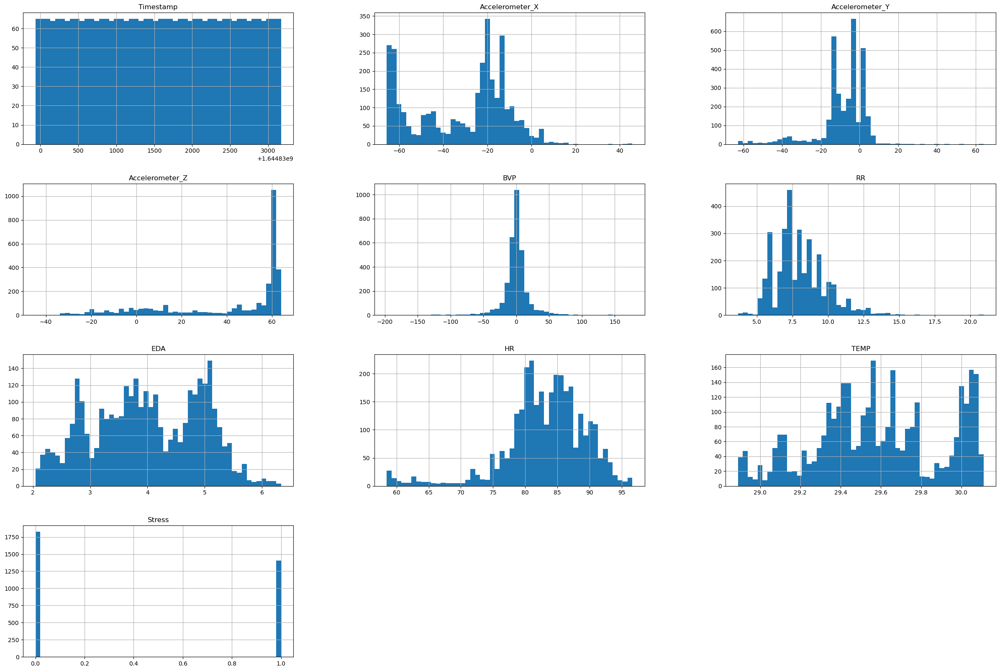

In [10]:
_= S05.hist(bins=50, figsize=(30,20))

 Histograms are plotted for the features of S05 to get an idea of the distribution of data

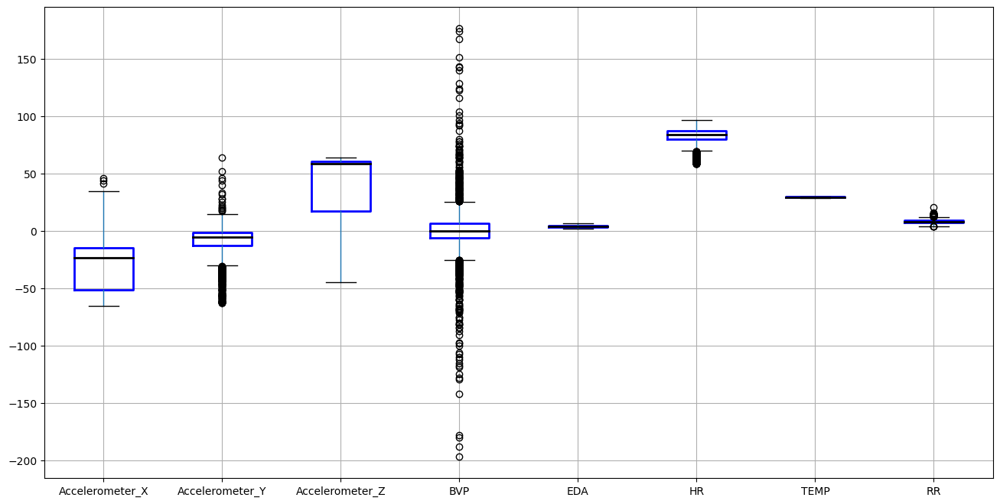

In [11]:
np.random.seed(50)
plt.rcParams["figure.figsize"] = [16, 8]
boxprops = dict(linestyle='-', linewidth=2, color='b')
medianprops = dict(linestyle='-', linewidth=2, color='k')
df = pd.DataFrame(S05,
                  columns=['Accelerometer_X', 'Accelerometer_Y', 'Accelerometer_Z', 'BVP', 'EDA', 'HR', 'TEMP','RR'])
boxplot = df.boxplot(column=['Accelerometer_X', 'Accelerometer_Y', 'Accelerometer_Z', 'BVP', 'EDA', 'HR', 'TEMP','RR'],boxprops=boxprops,
                medianprops=medianprops) 


From the boxplot of features of S05, it can be derived that the Accelerometer_X  contains mostly negative values except some outliers. The Accelerometer_Y and Accelerometer_Z are negatively skewed.  For this participant, the BVP is concentrated around zero with many outliers. The EDA is concentrated around zero. The HR is concentrated around 70 with some outliers. The Temperature is concentrated at around 30. The Respiratory Rate also contains some outliers.

<Axes: >

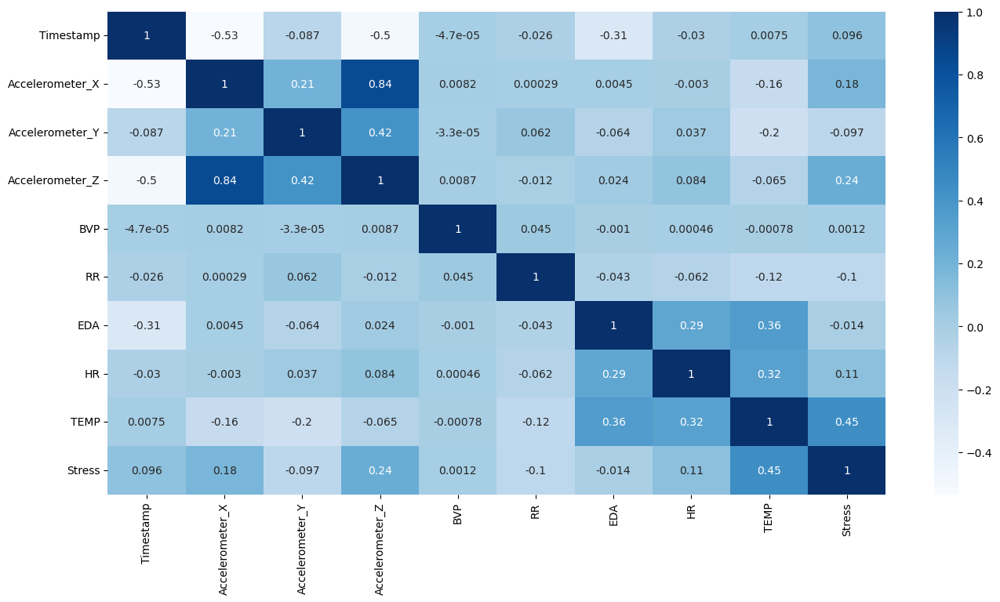

In [12]:
correlation  = S05.corr() 
sns.heatmap(correlation, xticklabels=correlation.columns, yticklabels=correlation.columns, annot=True, cmap=sns.color_palette("Blues", as_cmap=True))

 From the Heatmap it can be derived Accelerometer_X and Accelerometer_Y features of S05 are correlated.  

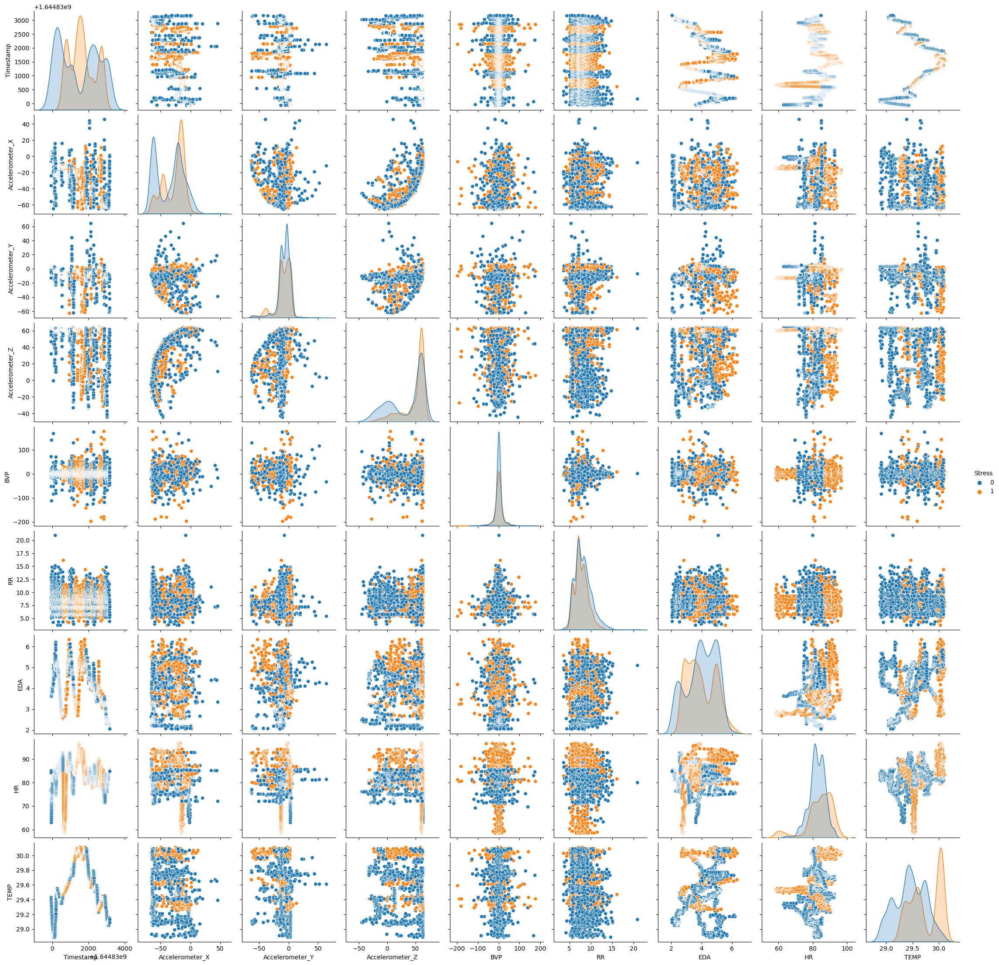

In [13]:
#From the pairplot we are trying to analyse the relation between the different features for each participants
sns.pairplot(S05,hue="Stress")

In [14]:
import plotly.graph_objs as go
import numpy as np

# Create a Plotly trace for the signal data
trace = go.Scatter(x=S05['Timestamp'], y=S05['BVP'], mode='lines')

# Create a Plotly layout with axis labels and a title
layout = go.Layout(xaxis=dict(title='Time (s)'), yaxis=dict(title='BVP_S05'),
                   title='BVP Signal Plot for S05')

# Create a Plotly figure with the trace and layout
fig = go.Figure(data=[trace], layout=layout)
fig.update_layout(
    xaxis=dict(
        tickformat='d'
    )
)
# Show the Plotly figure
fig.show()

In [15]:
import plotly.graph_objs as go
import numpy as np

# Create a Plotly trace for the signal data
trace = go.Scatter(x=S05['Timestamp'], y=S05['EDA'], mode='lines')

# Create a Plotly layout with axis labels and a title
layout = go.Layout(xaxis=dict(title='Time (s)'), yaxis=dict(title='EDA_S05'),
                   title='Signal Plot')

# Create a Plotly figure with the trace and layout
fig = go.Figure(data=[trace], layout=layout)
fig.update_layout(
    xaxis=dict(
        tickformat='d'
    )
)
# Show the Plotly figure
fig.show()

In [16]:
import plotly.graph_objs as go
import numpy as np

# Create a Plotly trace for the signal data
trace = go.Scatter(x=S05['Timestamp'], y=S05['HR'], mode='lines')

# Create a Plotly layout with axis labels and a title
layout = go.Layout(xaxis=dict(title='Time (s)'), yaxis=dict(title='HR_S05'),
                   title='')

# Create a Plotly figure with the trace and layout
fig = go.Figure(data=[trace], layout=layout)
fig.update_layout(
    xaxis=dict(
        tickformat='d'
    )
)
# Show the Plotly figure
fig.show()

In [17]:
import plotly.graph_objs as go
import numpy as np

# Create a Plotly trace for the signal data
trace = go.Scatter(x=S05['Timestamp'], y=S05['RR'], mode='lines')

# Create a Plotly layout with axis labels and a title
layout = go.Layout(xaxis=dict(title='Time (s)'), yaxis=dict(title='RR_S05'),
                   title='Signal Plot')

# Create a Plotly figure with the trace and layout 
fig = go.Figure(data=[trace], layout=layout)
fig.update_layout(
    xaxis=dict(
        tickformat='d'
    )
)
# Show the Plotly figure
fig.show()

###                                                                              BVP,HR, EDA and Temp signal 

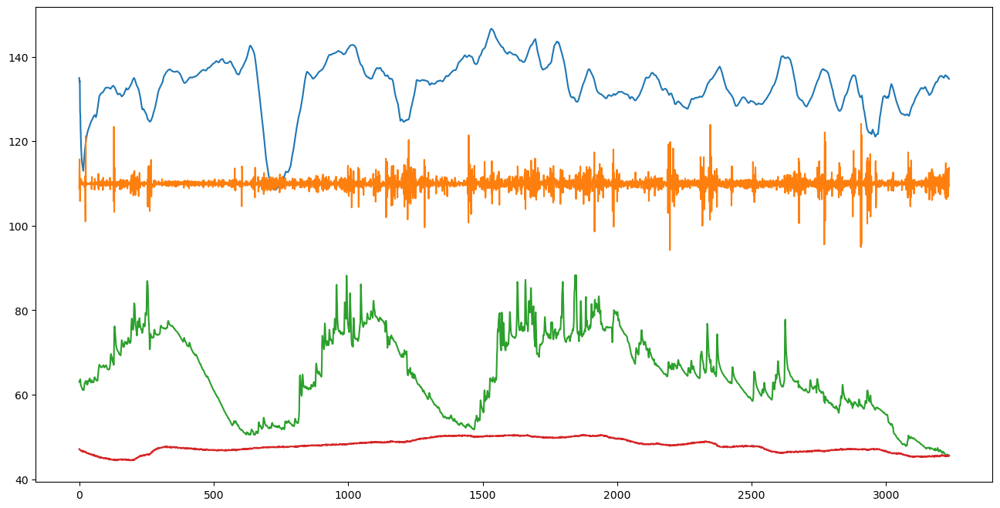

In [18]:
plt.plot(S05.HR+50)
plt.plot(S05.BVP*0.08 +110)
plt.plot(S05.EDA*10+25)
plt.plot(S05.TEMP*5-100)

In [19]:
#Loading the  processed dataset for S15
S15=pd.read_csv("D:\EssexFiles\DSDM\Stress-Predict-Dataset-main\Stress-Predict-Dataset-main\Data_Processed\S15.csv")
S15.head(15)

,Timestamp,Accelerometer_X,Accelerometer_Y,Accelerometer_Z,BVP,RR,EDA,HR,TEMP,Stress
0,1.645447e+09,-5.81250,10.50000,61.87500,-0.148125,9.263158,0.270665,85.00,30.79,0
1,1.645447e+09,-4.90625,7.09375,62.31250,4.874375,10.421053,0.269063,80.00,30.79,0
2,1.645447e+09,-27.68750,19.93750,52.68750,1.031406,7.542857,0.267141,87.00,30.79,0
3,1.645447e+09,-29.84375,23.15625,51.18750,4.822031,9.209302,0.264259,91.00,30.79,0
4,1.645447e+09,-30.59375,22.87500,51.06250,-3.252031,7.542857,0.263297,84.40,30.79,0
5,1.645447e+09,-30.75000,22.96875,50.87500,-4.070469,9.263158,0.261056,81.00,30.79,0
6,1.645447e+09,-30.68750,23.46875,50.71875,3.307812,7.542857,0.261056,80.29,30.77,0
7,1.645447e+09,-30.40625,23.81250,50.93750,-4.123594,8.608696,0.260735,79.62,30.79,0
8,1.645447e+09,-30.65625,23.56250,50.75000,1.843438,5.657143,0.257532,79.11,30.77,0
9,1.645447e+09,-32.62500,22.81250,49.90625,4.474687,10.421053,0.256891,78.50,30.79,0


In [20]:
S15.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3428 entries, 0 to 3427
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Timestamp        3428 non-null   float64
 1   Accelerometer_X  3428 non-null   float64
 2   Accelerometer_Y  3428 non-null   float64
 3   Accelerometer_Z  3428 non-null   float64
 4   BVP              3428 non-null   float64
 5   RR               3428 non-null   float64
 6   EDA              3428 non-null   float64
 7   HR               3428 non-null   float64
 8   TEMP             3428 non-null   float64
 9   Stress           3428 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 267.9 KB


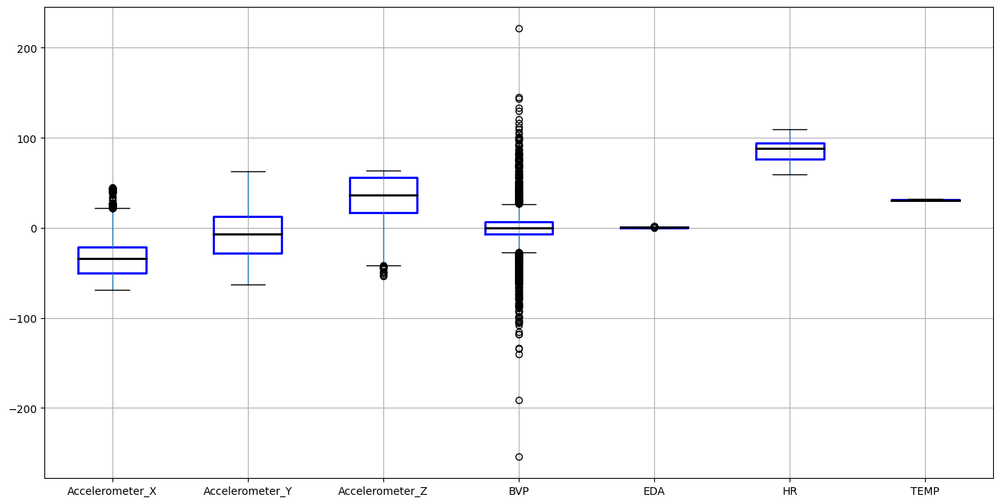

In [21]:
boxprops = dict(linestyle='-', linewidth=2, color='b')
medianprops = dict(linestyle='-', linewidth=2, color='k')
df = pd.DataFrame(S15,
                  columns=['Accelerometer_X', 'Accelerometer_Y', 'Accelerometer_Z', 'BVP', 'EDA', 'HR', 'TEMP'])
boxplot = df.boxplot(column=['Accelerometer_X', 'Accelerometer_Y', 'Accelerometer_Z', 'BVP', 'EDA', 'HR', 'TEMP'],boxprops=boxprops,
                medianprops=medianprops) 

### From the boxplot of features of S15, it can be derived that the Accelerometer_X  contains negative values except some outliers. For this participant, the BVP is concentrated around zero with many outliers. The EDA is concentrated around zero. The HR is concentrated around 80 and is negatively skewed. The Temperature is concentrated at around 35. 

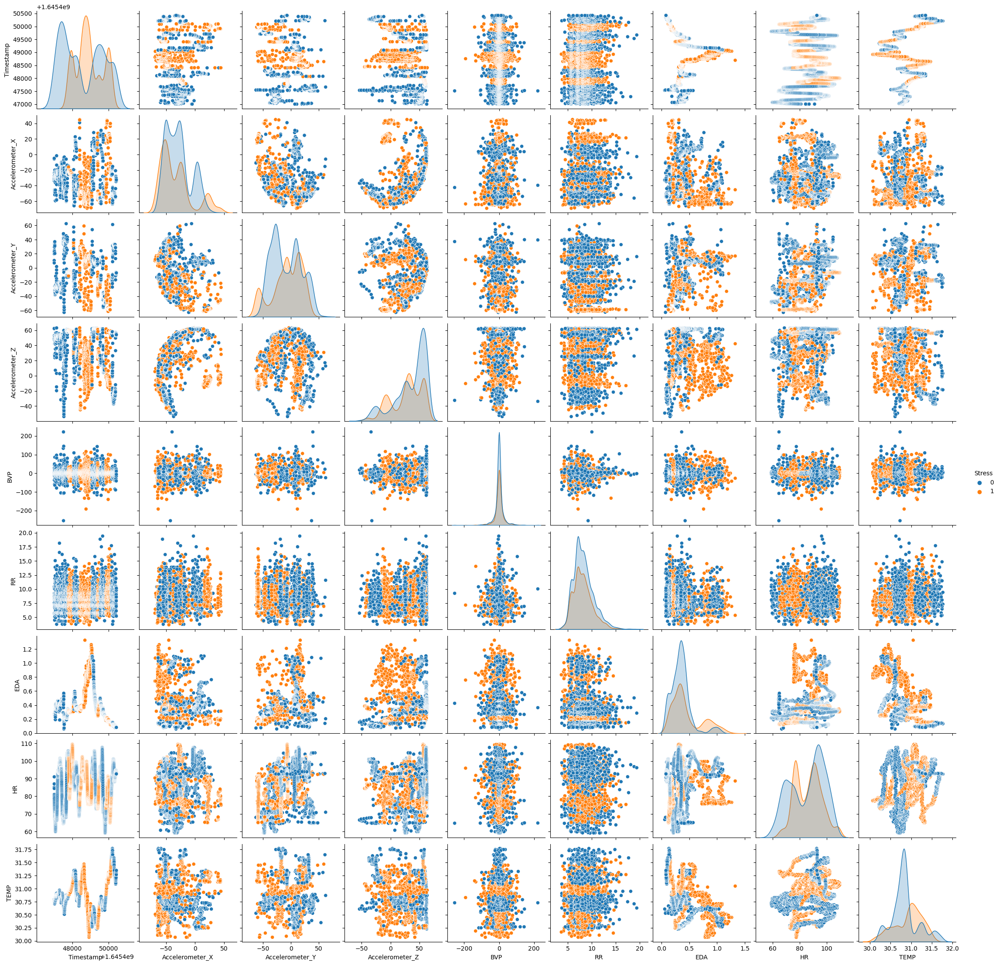

In [22]:
sns.pairplot(S15,hue="Stress")

<Axes: >

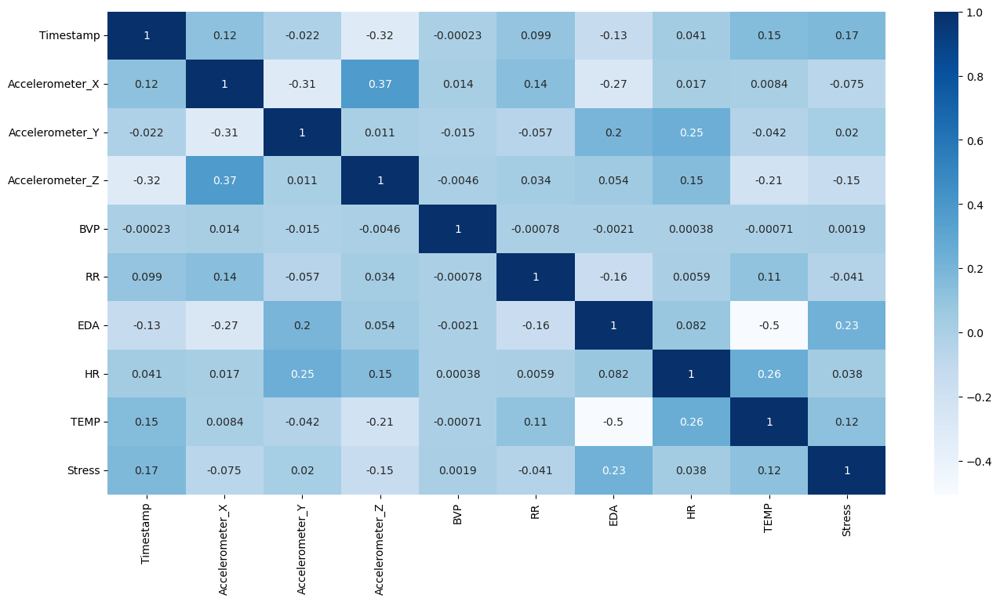

In [23]:
correlation  = S15.corr() 
sns.heatmap(correlation, xticklabels=correlation.columns, yticklabels=correlation.columns, annot=True, cmap=sns.color_palette("Blues", as_cmap=True))

### From the Heatmap it can be derived that none of the features of S15 are correlated. 


In [24]:
#Loading the  processed dataset for S33
S33=pd.read_csv("D:\EssexFiles\DSDM\Stress-Predict-Dataset-main\Stress-Predict-Dataset-main\Data_Processed\S33.csv")
S33.head(15)

,Timestamp,Accelerometer_X,Accelerometer_Y,Accelerometer_Z,BVP,RR,EDA,HR,TEMP,Stress
0,1.646828e+09,-52.03125,1.00000,38.00000,0.627969,8.105263,0.220709,66.00,30.43,0
1,1.646828e+09,-52.00000,0.96875,38.00000,0.286250,6.769231,0.221670,66.50,30.41,0
2,1.646828e+09,-52.03125,1.00000,38.00000,0.482656,8.105263,0.221991,67.33,30.43,0
3,1.646828e+09,-52.03125,1.00000,38.00000,5.200469,13.200000,0.220709,67.75,30.41,0
4,1.646828e+09,-52.00000,1.00000,38.00000,-6.577031,9.263158,0.221991,69.20,30.39,0
5,1.646828e+09,-52.00000,1.00000,37.96875,7.542969,8.105263,0.221029,70.17,30.37,0
6,1.646828e+09,-52.06250,1.00000,38.00000,1.737188,9.166667,0.221350,72.00,30.39,0
7,1.646828e+09,-52.00000,1.00000,38.00000,-6.553906,6.947368,0.221991,73.50,30.39,0
8,1.646828e+09,-52.00000,1.00000,38.00000,5.556250,11.733333,0.221029,74.89,30.39,0
9,1.646828e+09,-52.03125,1.00000,38.00000,-2.430313,10.153846,0.220389,75.90,30.37,0


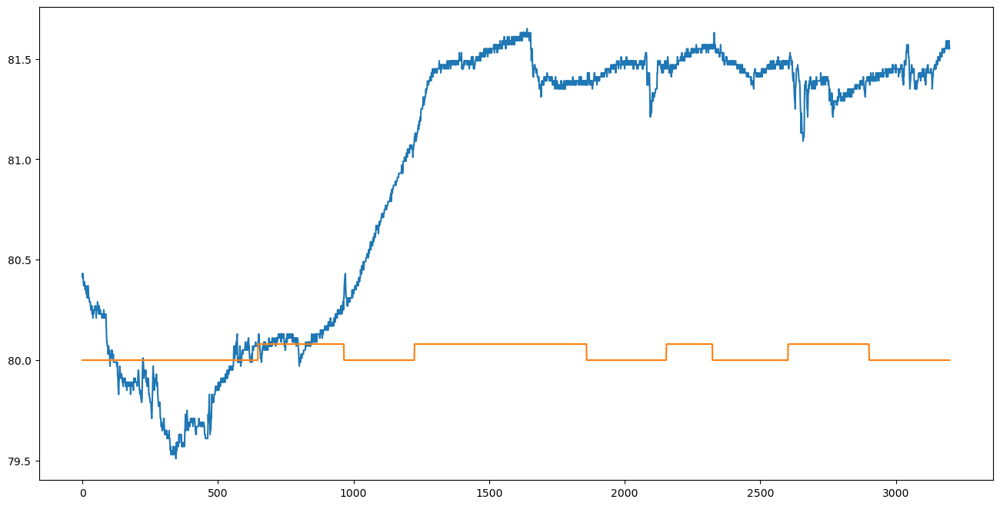

In [25]:
plt.plot(S33.TEMP+50)
plt.plot(S33.Stress*0.08 +80)

In [26]:
S33.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3199 entries, 0 to 3198
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Timestamp        3199 non-null   float64
 1   Accelerometer_X  3199 non-null   float64
 2   Accelerometer_Y  3199 non-null   float64
 3   Accelerometer_Z  3199 non-null   float64
 4   BVP              3199 non-null   float64
 5   RR               3199 non-null   float64
 6   EDA              3199 non-null   float64
 7   HR               3199 non-null   float64
 8   TEMP             3199 non-null   float64
 9   Stress           3199 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 250.0 KB


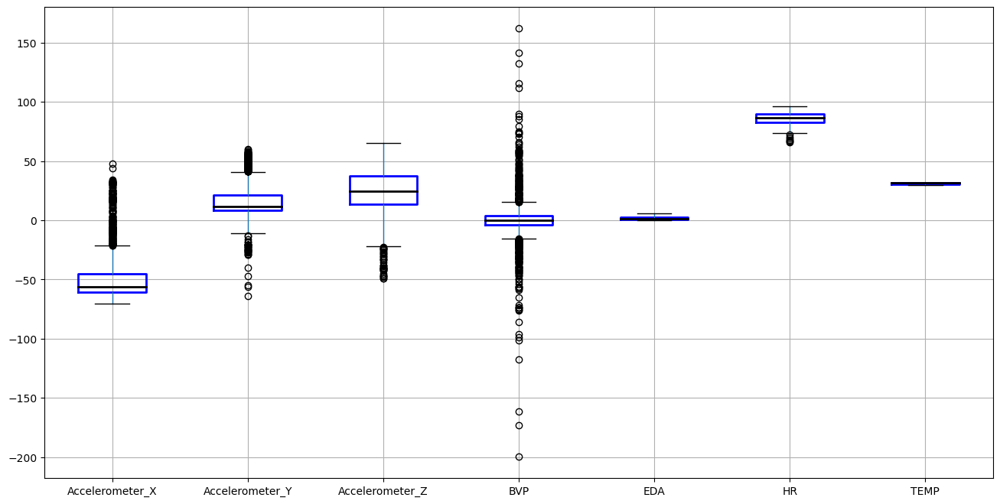

In [34]:
boxprops = dict(linestyle='-', linewidth=2, color='b')
medianprops = dict(linestyle='-', linewidth=2, color='k')
df = pd.DataFrame(S33,
                  columns=['Accelerometer_X', 'Accelerometer_Y', 'Accelerometer_Z', 'BVP', 'EDA', 'HR', 'TEMP'])
boxplot = df.boxplot(column=['Accelerometer_X', 'Accelerometer_Y', 'Accelerometer_Z', 'BVP', 'EDA', 'HR', 'TEMP'],boxprops=boxprops,
                medianprops=medianprops) 

### From the boxplot of features of S33, it can be derived that the Accelerometer_X  contains negative values except some outliers and is positively skewed. Accelerometer_Y and Accelerometer_Z also contains outliers. Accelerometer_Y is positively skewed. For this participant, the BVP is concentrated around zero with many outliers. The EDA is concentrated around zero. The HR is concentrated around 80. The Temperature is concentrated at around 35. 

### Feature Importance

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3235 entries, 0 to 3234
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Accelerometer_X  3235 non-null   float64
 1   Accelerometer_Y  3235 non-null   float64
 2   Accelerometer_Z  3235 non-null   float64
 3   BVP              3235 non-null   float64
 4   RR               3235 non-null   float64
 5   EDA              3235 non-null   float64
 6   HR               3235 non-null   float64
 7   TEMP             3235 non-null   float64
dtypes: float64(8)
memory usage: 202.3 KB
Features: None
Feature: 0, Score: 0.2340
Feature: 1, Score: 0.0532
Feature: 2, Score: 0.0058
Feature: 3, Score: 0.0071
Feature: 4, Score: 0.0036
Feature: 5, Score: 0.1079
Feature: 6, Score: 0.0914
Feature: 7, Score: 0.4968


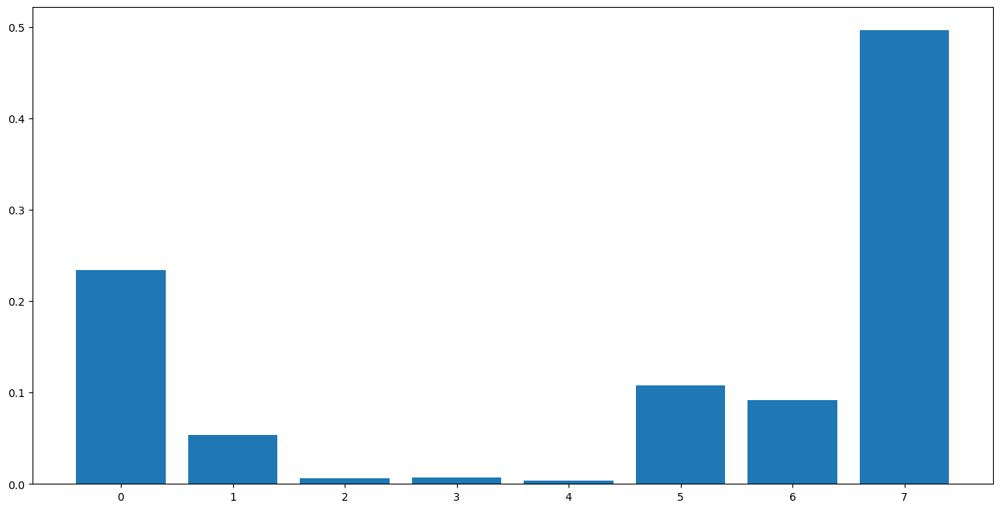

In [28]:
from sklearn.datasets import make_classification
from sklearn.tree import DecisionTreeClassifier
from matplotlib import pyplot
# define dataset
X= S05.drop(['Stress','Timestamp'],axis=1)
y = S05['Stress'] 
print("Features:",X.info())
model = DecisionTreeClassifier()
model.fit(X, y)
importance = model.feature_importances_
# summarize feature importance
for i,j in enumerate(importance):
  print('Feature: %0d, Score: %.4f' % (i,j))
# plot feature importance
pyplot.bar([i for i in range(len(importance))], importance) 
pyplot.show()

### Based on the features of S01, Timestamp seems to be the most important feature. DecisionTreeClassifier is used to get the feature importance. The Timestamp is considered for feature importance as we need to check further if Timestamp is a contributing factor.

In [29]:
#Random Forest Classifier with shuffle
def randomForest(df,shuffle):
    df= "D:\\EssexFiles\\DSDM\\Stress-Predict-Dataset-main\\Stress-Predict-Dataset-main\\Data_Processed\\" +df+ ".csv"
    df= pd.read_csv(df)
    X = df.drop(columns=['Stress','Timestamp','Accelerometer_X','Accelerometer_Y','Accelerometer_Z'], axis = 1)
    y = df['Stress'] 

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, shuffle=shuffle) 

    rfc = RandomForestClassifier(n_estimators=100)

    # Fit the model on the training data
    rfc.fit(X_train, y_train)

    # Predict on the testing data
    y_pred = rfc.predict(X_test)

    # Generate a classification report
    report = classification_report(y_test, y_pred)
    #print(report)
    np.set_printoptions(floatmode='fixed')
    cm = confusion_matrix(y_test, y_pred)
    #print(cm)

    accuracy = accuracy_score(y_test, y_pred)
    #print('Accuracy:', accuracy)

    # Plot the confusion matrix
    sns.heatmap(cm, annot=True, cmap="Blues")
    #plt.show()
    return accuracy  

In [30]:
#LSTM Model
def lstm(df,shuffle):
    df= "D:\\EssexFiles\\DSDM\\Stress-Predict-Dataset-main\\Stress-Predict-Dataset-main\\Data_Processed\\" +df+ ".csv"
    df= pd.read_csv(df)
    
    X = df.drop(columns=['Stress','Timestamp','Accelerometer_X','Accelerometer_Y','Accelerometer_Z'], axis = 1)
    y = df['Stress'] 
    
    model = Sequential()

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, shuffle=False)
    timesteps = 30 # assuming a sequence length of 30

    # define the LSTM model
    model = Sequential()
    model.add(LSTM(64,return_sequences=True,  dropout=0.2, recurrent_dropout=0.2, input_shape=(X_train.shape[1], 1)))
    model.add(LSTM(32,return_sequences=True, ))
    model.add(LSTM(8, return_sequences=True))
    model.add(Dense(1, activation='sigmoid'))

    # compile the model
    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

    # train the model
    model.fit(X_train, y_train, epochs=20, batch_size=32)

    # evaluate the model on the test data
    score = model.evaluate(X_test, y_test, batch_size=32)
   # print(score)

    y_pred = model.predict(X_test)
    # evaluate the model performance
    loss, accuracy = model.evaluate(X_test, y_test)
    y_pred = np.round(y_pred)
    return accuracy

Random Forest Accuracy for S01 0.6590909090909091
Epoch 1/20
71/71 [==============================] - 11s 12ms/step - loss: 0.6926 - accuracy: 0.5167
Epoch 2/20
71/71 [==============================] - 1s 12ms/step - loss: 0.6913 - accuracy: 0.5365
Epoch 3/20
71/71 [==============================] - 1s 12ms/step - loss: 0.6910 - accuracy: 0.5378
Epoch 4/20
71/71 [==============================] - 1s 12ms/step - loss: 0.6907 - accuracy: 0.5403
Epoch 5/20
71/71 [==============================] - 1s 12ms/step - loss: 0.6908 - accuracy: 0.5379
Epoch 6/20
71/71 [==============================] - 1s 12ms/step - loss: 0.6914 - accuracy: 0.5306
Epoch 7/20
71/71 [==============================] - 1s 12ms/step - loss: 0.6904 - accuracy: 0.5341
Epoch 8/20
71/71 [==============================] - 1s 11ms/step - loss: 0.6894 - accuracy: 0.5420
Epoch 9/20
71/71 [==============================] - 1s 12ms/step - loss: 0.6897 - accuracy: 0.5422
Epoch 10/20
71/71 [==============================] - 1s 13

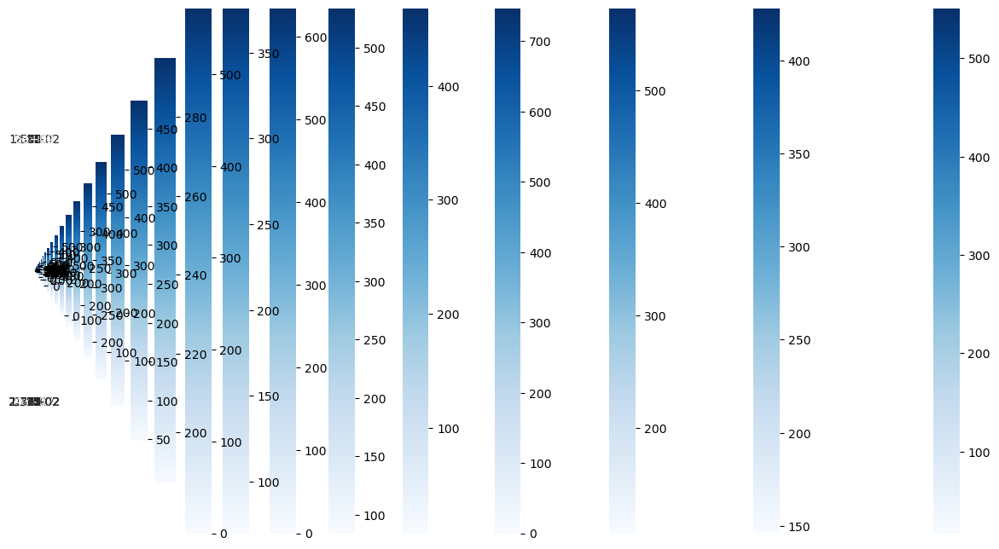

In [31]:
rfc=[]
lst=[]
for i in range (1,36):
    if i<10:
        sampleNumber="S0"+str(i)
    else:
        sampleNumber="S"+str(i)
    r=randomForest(sampleNumber,False)
    print("Random Forest Accuracy for "+sampleNumber, r)
    rfc.append(r)
    l=lstm(sampleNumber,False)
    print("LSTM Accuracy for "+sampleNumber,l)
    lst.append(l) 

In [32]:
maxRFC=max(rfc)
maxLSTM=max(lst)
print("Maximum accuracy of Random Forest Classifier: ",maxRFC)
print("Maximum accuracy of Long Short Term Memory: ",maxLSTM)

Maximum accuracy of Random Forest Classifier:  0.9037487335359676
Maximum accuracy of Long Short Term Memory:  0.9037487506866455


0.7435897435897436

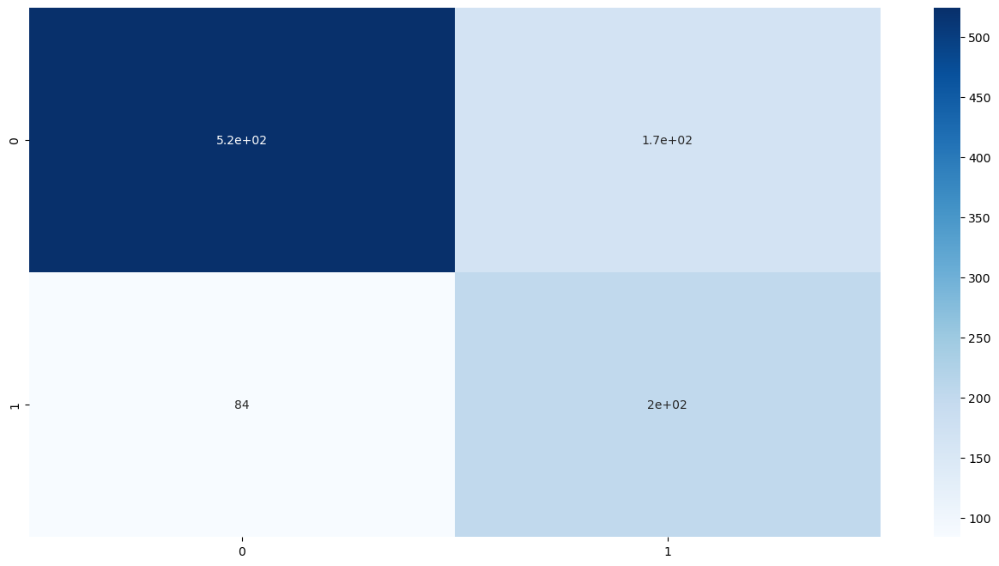

In [33]:
randomForest("S06",False)